In [410]:
import numpy as np
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, clear_output, Audio
%matplotlib inline
# %matplotlib widget
plt.rcParams['figure.dpi']= 150

Here, we will create a bifurcation diagram for the inner medulla model with salt dump.
The method we use is pseudo arclength algorithm.

In [3]:
# Transport parameters
s_perm = 1.2
u_perm_val = 1.2
w_D_perm = 10
w_C_perm = 10
S_input = 0.8
U_input = 2
osm_input = 2
u_frac = 1

# discretization
N = 50
dx = 1/N
u_perm = np.zeros(N)
for l in range(N):
    perm_grids = u_frac*N
    insul = np.floor(N-perm_grids)
    if l==insul:
        u_perm[l] = u_perm_val*(perm_grids - np.ceil(perm_grids-1))
    elif l>insul:
        u_perm[l] = u_perm_val

def diff_x(y): 
    n = len(y)-1
    diff = np.zeros(n)
    for l in range(n):
        diff[l] = (y[l+1]-y[l])/dx
    
    return diff

def avg(y):
    n = len(y)-1
    average = np.zeros(n)
    for l in range(n):
        average[l] = (y[l+1]+y[l])/2
    
    return average

In [28]:
def res(y,mode='s_dump',y_prev=None,h=0,val=0):
    S = y[:(N+1)].copy()
    U = y[(N+1):2*(N+1)].copy()
    q_D = y[2*(N+1):3*(N+1)].copy()
    q_C = y[3*(N+1):4*(N+1)].copy()
    q_A = y[4*(N+1):5*(N+1)].copy()
    q_out = y[5*(N+1):6*(N+1)].copy()
    param = y[6*(N+1)]
    S_avg = avg(S)
    U_avg = avg(U)
    q_D_avg = avg(q_D)
    q_C_avg = avg(q_C)
    q_A_avg = avg(q_A)
    # q_out_avg = avg(q_out)

    s_dump = 0
    u_perm = 1.2
    s_perm = 1.2
    if h>0:
        if mode=='dump':
            s_dump = param
        elif mode=='perm':
            u_perm = param
            s_perm = param
    else:
        if mode=='dump':
            s_dump = val
        elif mode=='perm':
            u_perm = val
            s_perm = val

    # S_0 = np.zeros(N)
    S_0 = np.zeros(N+1)
    # for l in range(N):
    for l in range(N+1):
        # S_0[l] = S[-1] - S_avg[l] - s_dump*(1-(l+0.5)*dx)
        S_0[l] = S[-1] - S[l] - s_dump*(1-l*dx)
    S_0 = avg(S_0)
    U_0 = U[-1] - U_avg
    # q_0 = q_out_avg - q_C_avg - q_A_avg - q_D_avg
    q_0 = np.zeros(N+1)
    q_0[:-1] = q_out[:-1] - q_C[:-1] - q_A[:-1] - q_D[:-1]
    # q_0 = q_out - q_C - q_A - q_D
    q_0_avg = avg(q_0)

    residue = np.zeros(6*N+7)
    res_s = residue[:(N+1)]
    res_u = residue[(N+1):2*(N+1)]
    res_D = residue[2*(N+1):3*(N+1)]
    res_C = residue[3*(N+1):4*(N+1)]
    res_A = residue[4*(N+1):5*(N+1)]
    res_out = residue[5*(N+1):6*(N+1)]
    res_dump = residue[6*(N+1):]

    res_s[0] = S[-1] + S_input
    res_s[1:] = diff_x(S) + s_perm*(
        # (S_avg/q_A_avg) - (S_0/q_0)
        (S_avg/q_A_avg) - (S_0/q_0_avg)
    )
    res_u[0] = U[0] - U_input
    res_u[1:] = diff_x(U) + u_perm*(
        # (U_avg/q_C_avg) - (U_0/q_0)
        (U_avg/q_C_avg) - (U_0/q_0_avg)
    )
    res_D[0] = q_D[0] - 2*S_input/osm_input
    res_D[1:] = diff_x(q_D) + w_D_perm*(
        # (2*S_0 + U_0)/q_0 - 2*S_input/q_D_avg 
        (2*S_0 + U_0)/q_0_avg - 2*S_input/q_D_avg 
    )
    res_C[0] = q_C[0] - U_input/osm_input
    res_C[1:] = diff_x(q_C) + w_C_perm*(
        # (2*S_0 + U_0)/q_0 - U_avg/q_C_avg 
        (2*S_0 + U_0)/q_0_avg - U_avg/q_C_avg 
    )
    res_A[0] = q_A[-1] + q_D[-1]
    res_A[1:] = diff_x(q_A)
    res_out[0] = q_C[-1] - q_out[-1]
    res_out[1:] = diff_x(q_out)

    if h>0:
        tgnt = y_prev[1] - y_prev[0]
        tgnt = tgnt/np.sqrt(tgnt @ tgnt)
        res_dump[:] = tgnt @ (y - y_prev[1]) - h
    else:
        res_dump[:] = param - val

    return residue

In [118]:
y_init = np.zeros(6*N+7)
S_init = y_init[:(N+1)]
U_init = y_init[(N+1):2*(N+1)]
q_D_init = y_init[2*(N+1):3*(N+1)]
q_C_init = y_init[3*(N+1):4*(N+1)]
q_A_init = y_init[4*(N+1):5*(N+1)]
q_out_init = y_init[5*(N+1):6*(N+1)]
s_dump_init = y_init[6*(N+1):]

# third_ss = np.load('./conv_to_third_ss.npy')[-1]
third_ss = np.load('./dynamic_stable_v2.npy')[-1]
S_init[:] = third_ss[4*(N+1):5*(N+1)]*third_ss[8*N+6:]*1.5
U_init[:] = third_ss[5*(N+1):6*(N+1)]*third_ss[(N+1):2*(N+1)]*1.5
q_D_init[:] = third_ss[:N+1]
q_C_init[:] = third_ss[(N+1):2*(N+1)]
q_A_init[:] = third_ss[8*N+6:]
q_out_init[:] = q_C_init[-1]

y_init[:] = fsolve(res,y_init,args=('dump'))

In [124]:
# y = np.vstack((y_init,np.zeros(6*N+7)))
# y[-1] = fsolve(res,y_init,args=('dump',None,0,0.005))
# y=y[:61]
# y = np.vstack((y[0],np.zeros(6*N+7)))
# y[-1] = fsolve(res,y[0],args=('dump',None,0,y[0,-1]+0.0025))

steps = 5
for n in range(steps):
    h = 0.05
    while True:
        try:
            y_0 = fsolve(res,y[-1],args=('dump',y[-2:],h))
            break
        except RuntimeWarning:
            h = h*0.8
            display(h)
    y = np.vstack((y,y_0))

S = y[:,:(N+1)]
U = y[:,(N+1):2*(N+1)]
q_D = y[:,2*(N+1):3*(N+1)]
q_C = y[:,3*(N+1):4*(N+1)]
q_A = y[:,4*(N+1):5*(N+1)]
q_out = y[:,5*(N+1):6*(N+1)]
dump = y[:,6*(N+1):]
# Plotting osmolarity
# q_0_init = q_out_init - q_C_init - q_A_init - q_D_init
# S_0_init = S_init[-1] - avg(S_init)
# U_0_init = U_init[-1] - avg(U_init)
# osm_0 = (2*S_0_init+U_0_init)/avg(q_0_init)
# osm_C = U_init/q_C_init
# osm_D = 2*S_input/q_D_init
# osm_A = 2*S_init/q_A_init
q_0 = q_out - q_C - q_A - q_D
iters = y.shape[0]
S_0 = np.zeros((iters,N))
U_0 = np.zeros((iters,N))
osm_0 = np.zeros((iters,N))
for k in range(iters):
    S_0[k] = S[k,-1] - avg(S[k])
    U_0[k] = U[k,-1] - avg(U[k])
    osm_0[k] = (2*S_0[k]+U_0[k])/avg(q_0[k])
osm_C = U/q_C
osm_D = 2*S_input/q_D
osm_A = 2*S/q_A

compartments = ['0','\mathrm{D}','\mathrm{C}','\mathrm{A}']
osm = [osm_0,osm_D,osm_C,osm_A]
q = [q_0,q_D,q_C,q_A]

In [126]:
y = np.vstack((y,fsolve(res,y[-1],args=('dump',None,0,0))))
S = y[:,:(N+1)]
U = y[:,(N+1):2*(N+1)]
q_D = y[:,2*(N+1):3*(N+1)]
q_C = y[:,3*(N+1):4*(N+1)]
q_A = y[:,4*(N+1):5*(N+1)]
q_out = y[:,5*(N+1):6*(N+1)]
dump = y[:,6*(N+1):]
# Plotting osmolarity
# q_0_init = q_out_init - q_C_init - q_A_init - q_D_init
# S_0_init = S_init[-1] - avg(S_init)
# U_0_init = U_init[-1] - avg(U_init)
# osm_0 = (2*S_0_init+U_0_init)/avg(q_0_init)
# osm_C = U_init/q_C_init
# osm_D = 2*S_input/q_D_init
# osm_A = 2*S_init/q_A_init
q_0 = q_out - q_C - q_A - q_D
iters = y.shape[0]
S_0 = np.zeros((iters,N))
U_0 = np.zeros((iters,N))
osm_0 = np.zeros((iters,N))
for k in range(iters):
    S_0[k] = S[k,-1] - avg(S[k])
    U_0[k] = U[k,-1] - avg(U[k])
    osm_0[k] = (2*S_0[k]+U_0[k])/avg(q_0[k])
osm_C = U/q_C
osm_D = 2*S_input/q_D
osm_A = 2*S/q_A

compartments = ['0','\mathrm{D}','\mathrm{C}','\mathrm{A}']
osm = [osm_0,osm_D,osm_C,osm_A]
q = [q_0,q_D,q_C,q_A]

<function matplotlib.pyplot.show(close=None, block=None)>

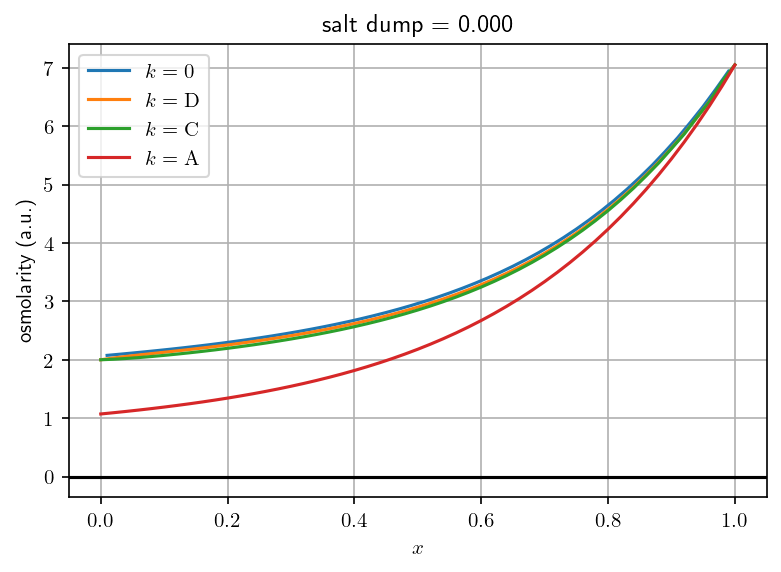

In [127]:
x = np.linspace(0,1,num=N+1)
x_avg = np.linspace(dx/2,1-dx/2,num=N)
fig, ax = plt.subplots()
compartments = ['0','\mathrm{D}','\mathrm{C}','\mathrm{A}']
plt.rcParams['text.usetex'] = True
ax.grid(True, which='both')
ax.axhline(y=0, color='k')
for k in range(4):
    if k==0:
        ax.plot(x_avg,osm[0][-1],label=r'$k={}$'.format(compartments[k]))
    else:
        ax.plot(x,osm[k][-1],label=r'$k={}$'.format(compartments[k]))
ax.legend()
ax.set_title(r'salt dump = {:.3f}'.format(dump[-1,0]))
plt.xlabel(r"$x$")
plt.ylabel(r"osmolarity (a.u.)")
plt.show

C:\Users\馬予棟\AppData\Local\Temp/ipykernel_18932/3982133735.py:24: UserWarning: The handle <matplotlib.lines.Line2D object at 0x0000020E325BED30> has a label of '_child0' which cannot be automatically added to the legend.
  ax.legend(lines, labels)
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_18932/3982133735.py:24: UserWarning: The handle <matplotlib.lines.Line2D object at 0x0000020E30609D00> has a label of '_child0' which cannot be automatically added to the legend.
  ax.legend(lines, labels)


<function matplotlib.pyplot.show(close=None, block=None)>

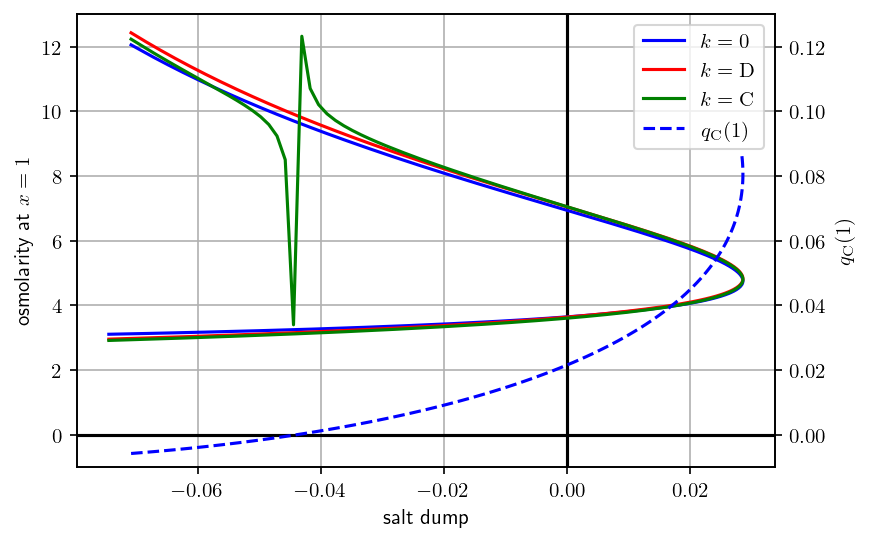

In [116]:
dumps = np.ravel(dump)
compartments = ['0','\mathrm{D}','\mathrm{C}']
colors = ['b','r','g']
plt.rcParams['text.usetex'] = True
fig, ax = plt.subplots()
ax.grid(True, which='both')
ax.set_xlabel(r"salt dump")
ax.set_ylabel(r"osmolarity at $x=1$")
# ax.set_ylim(0,osm[0][0,-1]+1)
ax.axvline(x=0, color='k')
ax.set_ylim(-1,13)
for k in range(3):
    ax.plot(dumps, osm[k][:,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
ax2 = ax.twinx()
ax2.set_ylabel(r"$q_\mathrm{C}(1)$")
# ax2.set_ylabel(r"fuck this")
ax2.axhline(y=0, color='k')
ax2.set_ylim(-0.01,0.13)
ax2.plot(dumps[:111], q_C[:111,-1], 'b--', label=r'$q_\mathrm{C}(1)$')
# ax.legend()
# plot = plot1+plot2
lines = ax.get_lines() + ax2.get_lines()
labels = [l.get_label() for l in lines]
ax.legend(lines, labels)
# plt.xlabel(r"salt dump")
# plt.ylabel(r"osmolarity at $x=1$")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

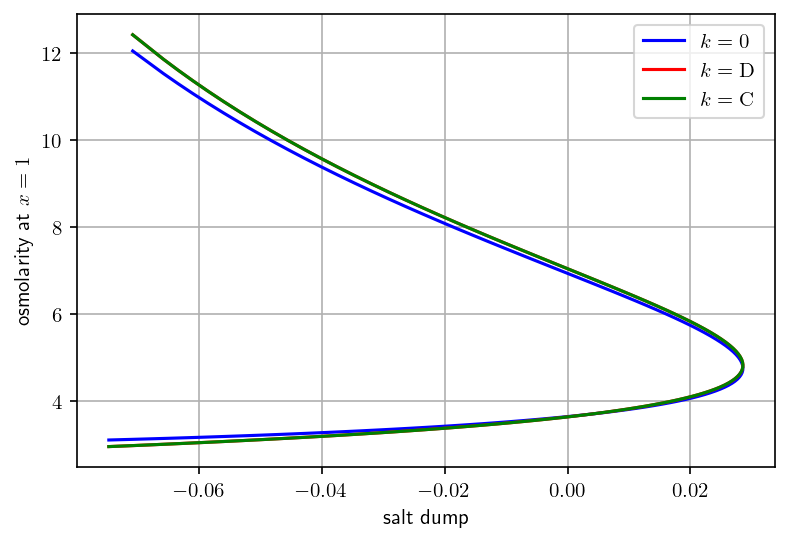

In [397]:
dumps = np.ravel(dump)
compartments = ['0','\mathrm{D}','\mathrm{C}']
colors = ['b','r','g']
fig, ax = plt.subplots()
plt.rcParams['text.usetex'] = True
ax.grid(True, which='both')
for k in range(3):
    ax.plot(dumps, osm[k][:,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
ax.legend()
plt.xlabel(r"salt dump")
plt.ylabel(r"osmolarity at $x=1$")
plt.show

In [394]:
dumps

array([-0.07082899, -0.06582899, -0.06345201, -0.06102797, -0.05855672,
       -0.05604003, -0.05348017, -0.05087999, -0.0482429 , -0.04557291,
       -0.04287463, -0.04015324, -0.03741445, -0.03466445, -0.03190984,
       -0.02915752, -0.02641461, -0.02368829, -0.02098578, -0.01831412,
       -0.01568016, -0.01309041, -0.01055103, -0.00806771, -0.00564568,
       -0.00328966, -0.00100389,  0.00120791,  0.0033425 ,  0.00539708,
        0.0073693 ,  0.0092572 ,  0.01105917,  0.01277395,  0.01440056,
        0.01593829,  0.01738665,  0.01874538,  0.02001438,  0.0211937 ,
        0.02228356,  0.02328425,  0.02419621,  0.02501992,  0.02575596,
        0.02640497,  0.02696764,  0.02744471,  0.02783694,  0.02814514,
        0.02837013,  0.02851276,  0.0285739 ,  0.02855442,  0.0284552 ,
        0.02827715,  0.02802116,  0.02768812,  0.02727895,  0.02679454,
        0.02623581,  0.02560364,  0.02489893,  0.02412259,  0.02327549,
        0.02235853,  0.02137258,  0.02031852,  0.01919721,  0.01

In [117]:
np.save('sn_bifctn_full.npy',y)

## diagram for positive dumps

<function matplotlib.pyplot.show(close=None, block=None)>

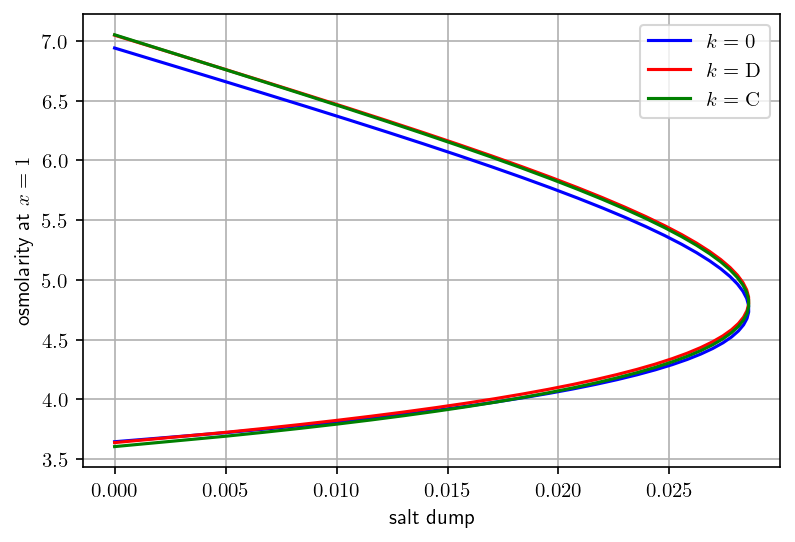

In [128]:
dumps = np.ravel(dump)
compartments = ['0','\mathrm{D}','\mathrm{C}']
colors = ['b','r','g']
plt.rcParams['text.usetex'] = True
fig, ax = plt.subplots()
ax.grid(True, which='both')
ax.set_xlabel(r"salt dump")
ax.set_ylabel(r"osmolarity at $x=1$")
# ax.set_ylim(0,osm[0][0,-1]+1)
# ax.set_ylim(-1,13)
for k in range(3):
    ax.plot(dumps, osm[k][:,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
ax.legend()
# plt.xlabel(r"salt dump")
# plt.ylabel(r"osmolarity at $x=1$")
plt.show

In [129]:
np.save('sn_bifctn_pos.npy',y)

# Diagram for permeabilities

In [130]:
y_init = np.zeros(6*N+7)
S_init = y_init[:(N+1)]
U_init = y_init[(N+1):2*(N+1)]
q_D_init = y_init[2*(N+1):3*(N+1)]
q_C_init = y_init[3*(N+1):4*(N+1)]
q_A_init = y_init[4*(N+1):5*(N+1)]
q_out_init = y_init[5*(N+1):6*(N+1)]
perm_init = y_init[6*(N+1):]

perm_init[:] = s_perm
# third_ss = np.load('./conv_to_third_ss.npy')[-1]
third_ss = np.load('./dynamic_stable_v2.npy')[-1]
S_init[:] = third_ss[4*(N+1):5*(N+1)]*third_ss[8*N+6:]*1.5
U_init[:] = third_ss[5*(N+1):6*(N+1)]*third_ss[(N+1):2*(N+1)]*1.5
q_D_init[:] = third_ss[:N+1]
q_C_init[:] = third_ss[(N+1):2*(N+1)]
q_A_init[:] = third_ss[8*N+6:]
q_out_init[:] = q_C_init[-1]

y_init[:] = fsolve(res,y_init,args=('perm',None,0,s_perm))

In [195]:
y=y_asymp[-14]
y = np.vstack((y,np.zeros(6*N+7)))
y[-1] = fsolve(res,y[0],args=('perm',None,0,y[0,-1]+0.01))
y[-1,-1]

0.010509420643191216

In [400]:
# y = np.vstack((y_init,np.zeros(6*N+7)))
# y[-1] = fsolve(res,y_init,args=('perm',None,0,s_perm-0.01))
# y_asymp = y[:-3]
# y=y[:-7]
# y=y_asymp[-1]
# y = np.vstack((y_asymp[-1],np.zeros(6*N+7)))
# y = np.vstack((y_asymp[-1],y_asymp[-14]))
# y[-1] = fsolve(res,y[0],args=('perm',None,0,0.01))

steps = 10
for n in range(steps):
    h = 0.001
    while True:
        try:
            y_0 = fsolve(res,y[-1],args=('perm',y[-2:],h))
            break
        except RuntimeWarning:
            h = h*0.8   
            display(h)
    y = np.vstack((y,y_0))

In [401]:
S = y[:,:(N+1)]
U = y[:,(N+1):2*(N+1)]
q_D = y[:,2*(N+1):3*(N+1)]
q_C = y[:,3*(N+1):4*(N+1)]
q_A = y[:,4*(N+1):5*(N+1)]
q_out = y[:,5*(N+1):6*(N+1)]
perm = y[:,6*(N+1):]

q_0 = q_out - q_C - q_A - q_D
iters = y.shape[0]
S_0 = np.zeros((iters,N))
U_0 = np.zeros((iters,N))
osm_0 = np.zeros((iters,N))
for k in range(iters):
    S_0[k] = S[k,-1] - avg(S[k])
    U_0[k] = U[k,-1] - avg(U[k])
    osm_0[k] = (2*S_0[k]+U_0[k])/avg(q_0[k])
osm_C = U/q_C
osm_D = 2*S_input/q_D
osm_A = 2*S/q_A

<function matplotlib.pyplot.show(close=None, block=None)>

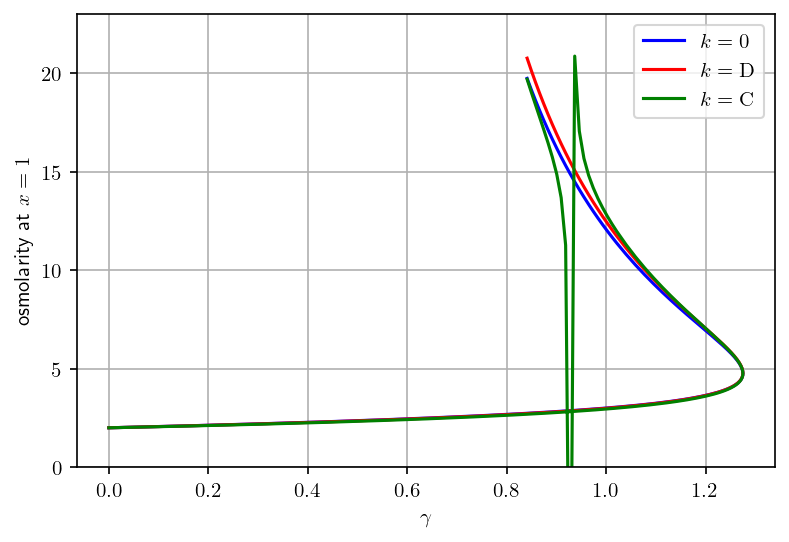

In [310]:
osm = [osm_0,osm_D,osm_C,osm_A]
perms = np.ravel(perm)
compartments = ['0','\mathrm{D}','\mathrm{C}']
colors = ['b','r','g']
fig, ax = plt.subplots()
ax.set_ylim(0,23)
plt.rcParams['text.usetex'] = True
ax.grid(True, which='both')
# plt.yscale('log')
for k in range(3):
    ax.plot(perms, osm[k][:,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
ax.legend()
plt.xlabel(r"$\gamma$")
plt.ylabel(r"osmolarity at $x=1$")
plt.show
# 141 frames

<function matplotlib.pyplot.show(close=None, block=None)>

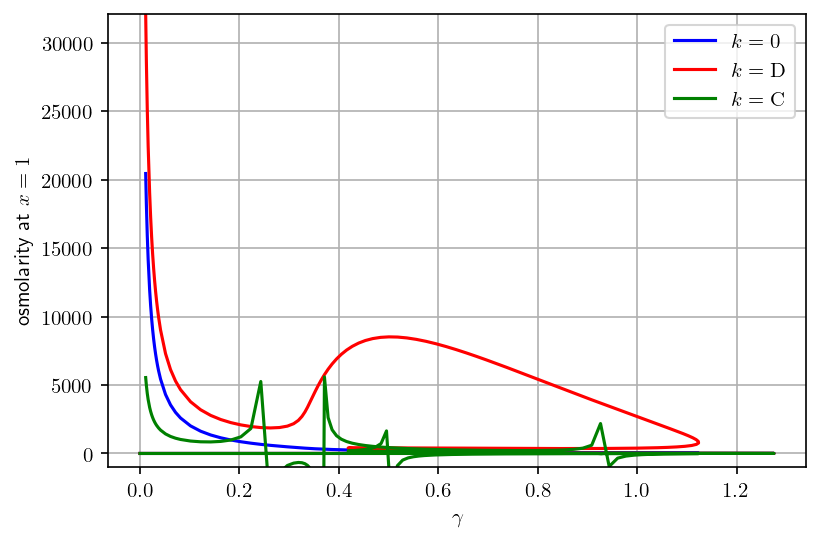

In [406]:
osm = [osm_0,osm_D,osm_C,osm_A]
perms = np.ravel(perm)
compartments = ['0','\mathrm{D}','\mathrm{C}']
colors = ['b','r','g']
fig, ax = plt.subplots()
ax.set_ylim(max([-1000,np.min(osm_C)]),np.max(osm_D))
plt.rcParams['text.usetex'] = True
ax.grid(True, which='both')
# plt.yscale('log')
for k in range(3):
    # ax.plot(perms[:161], osm[k][:161,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
    ax.plot(perms, osm[k][:,-1], label=r'$k={}$'.format(compartments[k]),color=colors[k])
ax.legend()
plt.xlabel(r"$\gamma$")
plt.ylabel(r"osmolarity at $x=1$")
plt.show

In [403]:
np.save('folding_ss.npy',y)

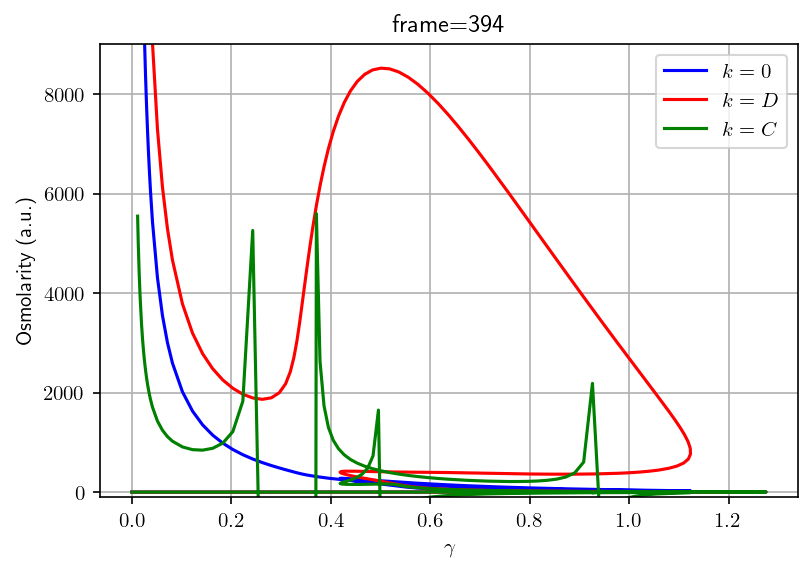

In [413]:
fig, ax = plt.subplots()
plt.rcParams['text.usetex'] = True
fig.set_facecolor('white')
ax.grid(True, which='both')

line1, = ax.plot(perms, osm_0[:,-1], color = "b", label=r'$k=0$')
line2, = ax.plot(perms, osm_D[:,-1], color = "r", label=r'$k=D$')
line3, = ax.plot(perms, osm_C[:,-1], color = "g", label=r'$k=C$')

def update(num, perm, osm, line1, line2, line3):
    line1.set_data(perm[:160+num], osm[0][:160+num,-1])
    line2.set_data(perm[:160+num], osm[1][:160+num,-1])
    line3.set_data(perm[:160+num], osm[2][:160+num,-1])
    ax.set_title(r'frame={}'.format(160+num))
    ax.set_ylim(max([-100,np.min(osm_C[:160+num,-1])]),min([9000,np.max(osm_D[:160+num,-1])]))
    return [line1,line2,line3]

ax.legend()
ax.set_xlabel(r'$\gamma$')
ax.set_ylabel(r'Osmolarity (a.u.)')
# ax.set_ylim(0, np.amax(osm_0)+1)

# ani = animation.FuncAnimation(fig, update, frames=1601, fargs=[x_avg, osm_D, osm_A, osm_C, osm_0, line1, line2, line3, line4],
#                   interval=100, blit=True)

# plt.show()
# plt.rcParams["animation.html"] = "jshtml"
ani = animation.FuncAnimation(fig, update, frames=235, fargs=[perms, osm, line1, line2, line3],
                  interval=40, blit=True)
from IPython.display import HTML
# HTML(ani.to_html5_video())
display(HTML(ani.to_jshtml()))
from winsound import Beep
Beep(300, 200)
Beep(300, 200)
Beep(300, 200)